# Two different robots

The code for this example is implemented [different_robots](https://github.com/jeguzzi/enki_env/tree/main/enki_env/examples/different_robots). Let us import it.

In [1]:
from enki_env.examples import different_robots

## Environment

The environment contains one Thymio and one E-Puck. Otherwise it is very similar to the previous "same robots" example:
same task, same reward, just different robots with (slightly in this case) different sensors.
    

To create the environment via script, run:
```console
python -m enki_env.examples.different_robot.environment
```

RFBOutputContext()


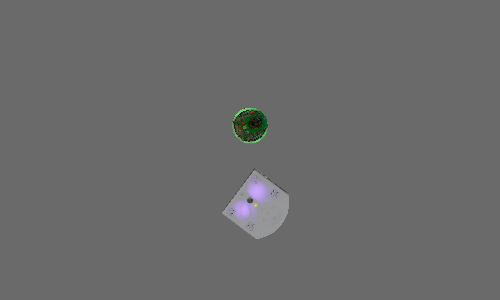

In [2]:
env = different_robots.make_env(render_mode="human")
env.reset()
env.snapshot()

The robots belong to different groups with different observation spaces

In [3]:
env.group_map

{'thymio': ['thymio_0'], 'e-puck': ['e-puck_0']}

In [4]:
env.observation_spaces

{'thymio_0': Dict('wheel_speeds': Box(-1.0, 1.0, (2,), float32), 'prox/value': Box(0.0, 1.0, (7,), float32)),
 'e-puck_0': Dict('wheel_speeds': Box(-1.0, 1.0, (2,), float32), 'prox/value': Box(0.0, 1.0, (8,), float32))}

## Baseline

We adapted the Thymio baseline to work for the E-Puck 

To evaluate the performances of both baselines via script, run:
```console
python -m enki_env.examples.different_robots.baseline
```

In [5]:
import inspect

print(inspect.getsource(different_robots.EPuckBaseline.predict))

    def predict(self,
                observation: Observation,
                state: State | None = None,
                episode_start: EpisodeStart | None = None,
                deterministic: bool = False) -> tuple[Action, State | None]:
        prox = np.atleast_2d(observation['prox/value'])
        m = np.max(prox, axis=-1)
        prox[m > 0] /= m[:, np.newaxis][m > 0]
        ws = np.array([(-0.1, -0.25, -0.5, -1, -1, 0.5, 0.25, 0.1)], dtype=np.float32)
        w = np.tensordot(prox, ws, axes=([1], [1]))
        w[m == 0] = 1
        return np.clip(w, -1, 1), None



To perform a rollout, we need to assign the policy to the whole group.

In [6]:
rollout = env.unwrapped.rollout(max_steps=10, policies={'thymio': different_robots.ThymioBaseline(), 
                                                        'e-puck': different_robots.EPuckBaseline()})

In [7]:
rollout.keys()

dict_keys(['thymio', 'e-puck'])

In [8]:
rollout['thymio'].episode_reward, rollout['e-puck'].episode_reward

(np.float64(-2.969223195758214), np.float64(-13.845665476374068))

## Reinforcement Learning

Let us now train and evaluate *two* RL policies for this task, one for each robot.

To perform this via script, run:
```console
python -m enki_env.examples.different_robots.rl
```

In [9]:
policies = different_robots.get_policies()

In [10]:
policies.keys()

dict_keys(['thymio', 'e-puck'])

In [11]:
rollout = env.rollout(max_steps=10, policies=policies)
rollout['thymio'].episode_reward, rollout['e-puck'].episode_reward

(np.float64(-3.5418375520177077), np.float64(-15.970891166964257))

## Learning a centralized policy

In alternative to learning two distributed policy (one for each type of robot), we could learn a single centralized policy that computes the action for both robots as once, taking as input the aggregated observation.

To perform this via script, run:
```console
python -m enki_env.examples.different_robots.centralized_policy_rl
```

We wrap the multi-agent environment in a *concatenated* environement

In [12]:
from enki_env.concat_env import ConcatEnv

In [13]:
cenv = ConcatEnv(different_robots.make_env())

The observation spaces contains all the keys of the individual robot observation spaces, with values that are concatenated when multiple robots have the same key.

In this case, for example, `prox/value` has a totol 15 values from the 7 thymio values and the 8 e-puck values.

In [14]:
cenv.observation_space

Dict('prox/value': Box(0.0, 1.0, (15,), float32), 'wheel_speeds': Box(-1.0, 1.0, (4,), float32))

Similarly, the action space is concatenation of all the action spaces of individual robots

In [15]:
cenv.action_space

Box(-1.0, 1.0, (2,), float32)

We can load and evaluate the policy similarly as with the other environements:

In [16]:
policy = different_robots.get_policy()
rollout = cenv.rollout(max_steps=10, policy=policy)
rollout['thymio'].episode_reward, rollout['e-puck'].episode_reward

(np.float64(-3.2257519966167836), np.float64(-18.096107888526664))

## Video

To conclude, to generate a similar video as before, you can run

```console
python -m enki_env.examples.different_robots.video
```

The following lines displays the video of alternating baseline (yellow) and distributed policy (cyan)

In [17]:
video = different_robots.make_video()
video.display_in_notebook(fps=30, width=640, rd_kwargs=dict(logger=None))

and the video of centralized policy (violet)

In [18]:
video = different_robots.make_video(centralized=True)
video.display_in_notebook(fps=30, width=640, rd_kwargs=dict(logger=None))